# 1. Import Libraries

In [1]:
import os
import io
import random
from collections import Counter, defaultdict

import numpy as np
from tqdm import tqdm
from PIL import Image
from skimage.io import imread
import imagesize
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

In [2]:
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [3]:
import warnings
warnings.filterwarnings("ignore")

# 2. Device Management

In [4]:
if torch.cuda.is_available():
    default_device = torch.device("cuda")
else:
    default_device = torch.device("cpu")

default_device

device(type='cuda')

In [5]:
def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# 3. Dataset Preparation

## 3-1. Extract Image Paths

In [6]:
data_dir = '/kaggle/input/animefacedataset/images'

In [7]:
image_paths = []
    
for file in os.listdir(data_dir):
    
    if file.endswith(".png") or file.endswith(".jpg"): 
        image_paths.append(
            os.path.join(data_dir, file)
        )

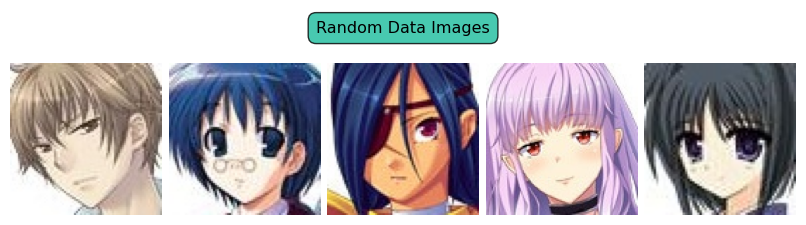

In [8]:
fig = plt.figure(figsize=(8, 2.5))
gs = GridSpec(2, 5, height_ratios=[0.15, 0.85])

title_ax = fig.add_subplot(gs[0, :])
title_ax.text(0.5, 0.5, "Random Data Images",
              fontsize=11.5, ha='center', va='center',
              bbox=dict(facecolor='#1ABC9C', edgecolor='black', 
                        boxstyle='round,pad=0.5', alpha=0.8))
title_ax.axis('off')

for j in range(5):
    ax = fig.add_subplot(gs[1, j])
    random_img = random.choice(image_paths)
    img = imread(random_img)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout(pad=0.5)
plt.show()

## 3-2. Check Image Dimensions

In [9]:
sizes = []

print("Processing images to get their dimensions...")

for img_path in tqdm(image_paths):
    width, height = imagesize.get(img_path)
    sizes.append(width)

Processing images to get their dimensions...


100%|██████████| 63565/63565 [05:44<00:00, 184.31it/s]


In [10]:
size_counts = Counter(sizes)
bin_size = 10
binned_counts = defaultdict(int)

for size, count in size_counts.items():
    bin_start = ((size - 1) // bin_size) * bin_size + 1
    bin_end = bin_start + bin_size - 1
    bin_label = f"{bin_start}-{bin_end}"
    binned_counts[bin_label] += count

sorted_bins = sorted(binned_counts.items(), key=lambda item: int(item[0].split('-')[0]))

labels = [item[0] for item in sorted_bins]
counts = [item[1] for item in sorted_bins]

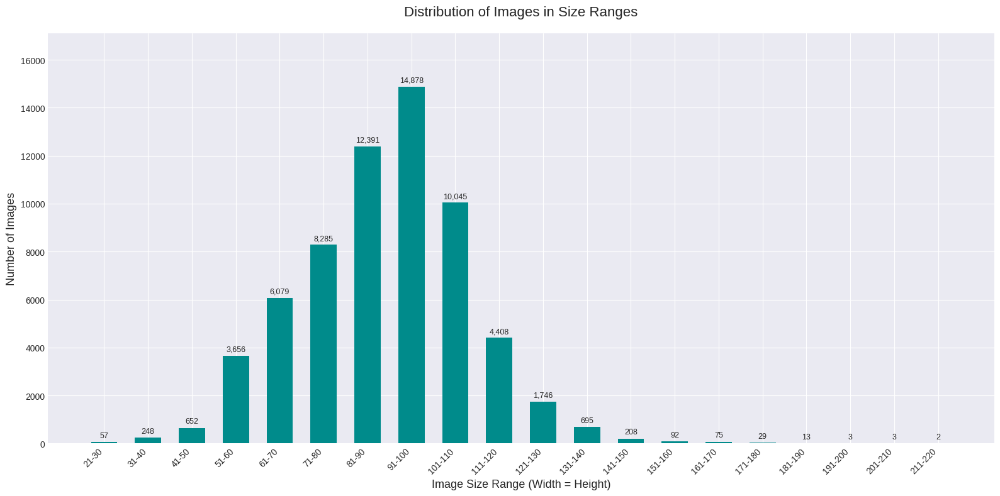

In [11]:
plt.style.use('seaborn-v0_8-darkgrid')
fig, ax = plt.subplots(figsize=(16, 8)) 

bars = ax.bar(labels, counts, color='darkcyan', width=0.6)

ax.set_title('Distribution of Images in Size Ranges', fontsize=16, pad=20)
ax.set_ylabel('Number of Images', fontsize=13)
ax.set_xlabel('Image Size Range (Width = Height)', fontsize=13)

plt.xticks(rotation=45, ha="right")

for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:,}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=9)

ax.set_ylim(top=max(counts) * 1.15)

plt.tight_layout()
plt.show()

In [12]:
filtered_image_paths = []

for img_path in image_paths:
    width, height = imagesize.get(img_path)
    if width > 50:
        filtered_image_paths.append(img_path)

<div class="alert alert-info" style="display: inline-block; padding: 8px 12px; margin: 0;">
Images with an image size (width = height) of <b>50 pixels or less</b> were <b>filtered out</b>.
</div>

## 3-3. Create Data Loaders

In [13]:
class ImageDataset(Dataset):
    def __init__(self, paths):
        self.paths = paths
        self.transform = None

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img_path = self.paths[idx]
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

    def set_transform(self, img_height, img_width):
        self.transform = transforms.Compose([
            transforms.Resize((img_height, img_width)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])

In [14]:
class DeviceDataLoader:
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        for batch in self.dataloader:
            yield to_device(batch, self.device)

    def __len__(self):
        return len(self.dataloader)

In [15]:
img_height, img_width = (64, 64)
batch_size = 64

In [16]:
dataset = ImageDataset(filtered_image_paths)

dataset.set_transform(img_height, img_width)

In [17]:
data_loader = DeviceDataLoader(
    DataLoader(
        dataset,
        batch_size = batch_size, 
        shuffle = True,
        pin_memory = True
    ), 
    default_device
)

# 4. Modeling

## 4-1. Build Model

In [18]:
# This model is based on the DCGAN architecture.

In [19]:
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 512 * 8 * 8, bias=False),
            nn.BatchNorm1d(512 * 8 * 8),
            nn.ReLU(),
            nn.Unflatten(1, (512, 8, 8)),
            nn.ConvTranspose2d(512, 256, kernel_size=5, stride=2, 
                               padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=5, stride=2, 
                               padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2, 
                               padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=5, stride=1, padding=2, bias=False),
            nn.Tanh()
        )
        
    def forward(self, x):
        return self.model(x)

    def set_device(self, device):
        self = to_device(self, device)

In [20]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2, bias=False),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2, bias=False),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            nn.Conv2d(128, 256, kernel_size=5, stride=2, padding=2, bias=False),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.3),
            nn.Flatten(),
            nn.Linear(256 * 8 * 8, 512, bias=False),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        return self.model(x)

    def set_device(self, device):
        self = to_device(self, device)

In [21]:
generator_model = Generator()
discriminator_model = Discriminator()

discriminator_model.set_device(default_device)
generator_model.set_device(default_device)

## 4-2. Model Training

In [22]:
def plot_images(gen_imgs):
    gen_imgs = gen_imgs.detach().cpu().numpy()
    gen_imgs = ((gen_imgs + 1) * 127.5).astype(np.uint8)
    gen_imgs = np.transpose(gen_imgs, (0, 2, 3, 1))
    
    fig, axs = plt.subplots(1, 5, figsize=(9, 3))
    for i in range(5):
        axs[i].imshow(gen_imgs[i])
        axs[i].axis('off')
    plt.subplots_adjust(wspace=0.05)
    plt.show()

In [23]:
def train_gan(generator, discriminator, dataset, epochs, 
              loss_function, g_optimizer, d_optimizer, device):
    history = []
    latent_dim = generator.latent_dim
    fixed_noise = torch.randn(5, latent_dim).to(device)
    
    for epoch in range(epochs):
        epoch_label = f"{epoch + 1}/{epochs}"
        g_losses = []
        d_losses = []
        
        for batch in tqdm(dataset, desc=f"Epoch {epoch_label} | Batches"):
            batch_size = batch.size(0)
            noise = torch.randn(batch_size, latent_dim).to(device)
            
            images = batch
            generated_images = generator(noise)

            real_labels = torch.ones(batch_size, 1).to(device)
            fake_labels = torch.zeros(batch_size, 1).to(device)

            # Train generator
            g_optimizer.zero_grad()
            fake_output = discriminator(generated_images)
            g_loss = loss_function(fake_output, real_labels)
            g_loss.backward()
            g_optimizer.step()
            g_losses.append(g_loss.item())
            
            # Train discriminator
            d_optimizer.zero_grad()
            real_output = discriminator(images)
            fake_output = discriminator(generated_images.detach())     
            d_loss = (
                loss_function(real_output, real_labels) + 
                loss_function(fake_output, fake_labels)
            )
            d_loss.backward()
            d_optimizer.step()
            d_losses.append(d_loss.item())
            
        report = {
            "epoch":    epoch_label,
            "g_loss":   float(np.mean(g_losses)),
            "d_loss":   float(np.mean(d_losses)),
            "gen_imgs": generator(fixed_noise).detach()
        }
        history.append(report)
        
        print(f"Epoch {report['epoch']} | G Loss: {report['g_loss']:.4f} | D Loss: {report['d_loss']:.4f}")
        plot_images(report['gen_imgs'])
        print()
    
    return history

In [24]:
g_optimizer = optim.Adam(
    generator_model.parameters(), 
    lr = 2e-4, 
    betas = (0.5, 0.999)
)

d_optimizer = optim.Adam(
    discriminator_model.parameters(), 
    lr = 1e-4, 
    betas = (0.5, 0.999)
)

Epoch 1/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.02it/s]


Epoch 1/50 | G Loss: 1.7970 | D Loss: 1.0129


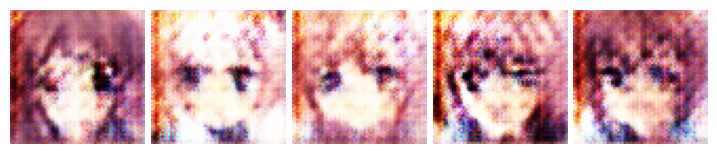

Epoch 2/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.10it/s]

Epoch 2/50 | G Loss: 1.1315 | D Loss: 1.0966


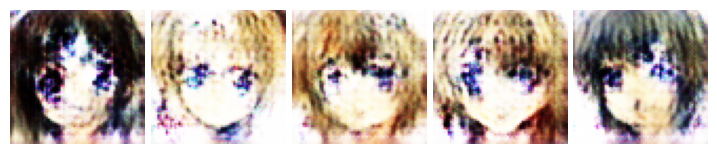

Epoch 3/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.10it/s]


Epoch 3/50 | G Loss: 1.0424 | D Loss: 1.0975


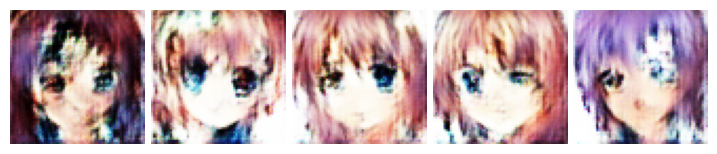

Epoch 4/50 | Batches: 100%|██████████| 979/979 [02:43<00:00,  5.98it/s]

Epoch 4/50 | G Loss: 1.0743 | D Loss: 1.0765


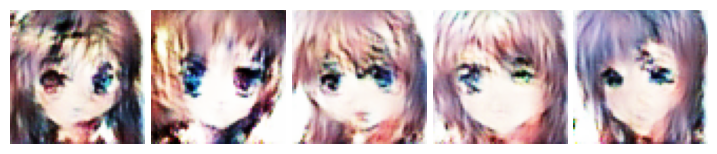

Epoch 5/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.03it/s]

Epoch 5/50 | G Loss: 1.0140 | D Loss: 1.1232


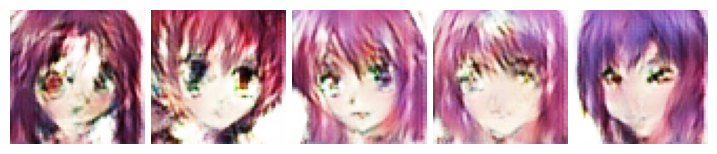

Epoch 6/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.04it/s]


Epoch 6/50 | G Loss: 0.9886 | D Loss: 1.1451


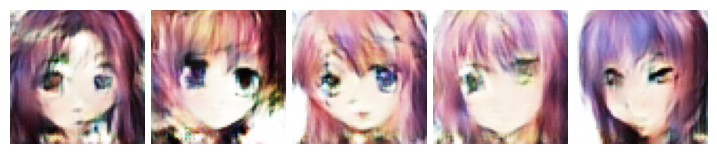

Epoch 7/50 | Batches: 100%|██████████| 979/979 [02:43<00:00,  5.98it/s]


Epoch 7/50 | G Loss: 0.9873 | D Loss: 1.1468


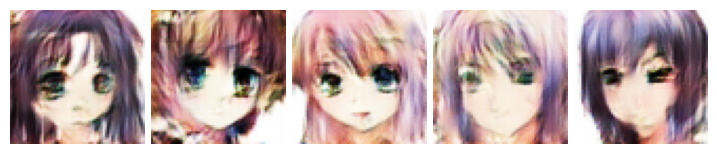

Epoch 8/50 | Batches: 100%|██████████| 979/979 [02:45<00:00,  5.91it/s]

Epoch 8/50 | G Loss: 0.9977 | D Loss: 1.1399


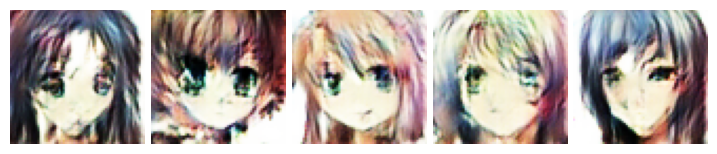

Epoch 9/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.04it/s]

Epoch 9/50 | G Loss: 0.9792 | D Loss: 1.1517


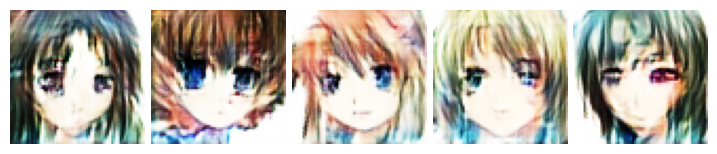

Epoch 10/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.04it/s]


Epoch 10/50 | G Loss: 0.9601 | D Loss: 1.1623


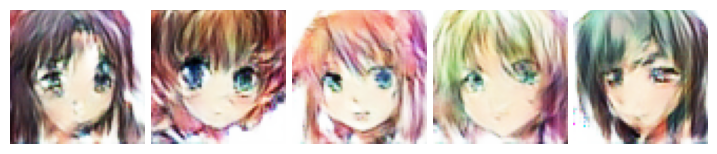

Epoch 11/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.01it/s]

Epoch 11/50 | G Loss: 0.9561 | D Loss: 1.1751


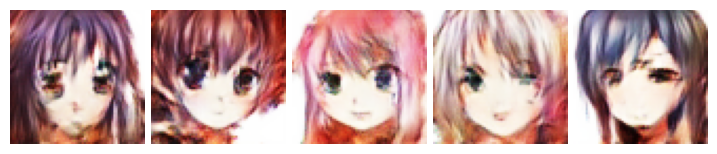

Epoch 12/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.07it/s]

Epoch 12/50 | G Loss: 0.9464 | D Loss: 1.1811


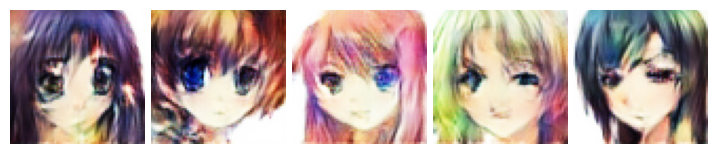

Epoch 13/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.12it/s]

Epoch 13/50 | G Loss: 0.9409 | D Loss: 1.1899


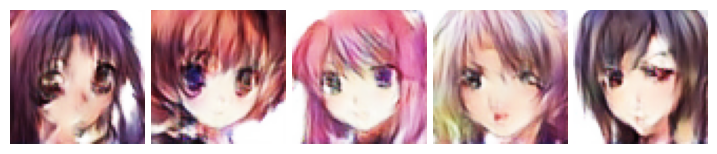

Epoch 14/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.06it/s]

Epoch 14/50 | G Loss: 0.9388 | D Loss: 1.1912


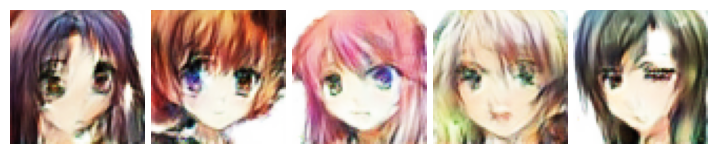

Epoch 15/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.06it/s]

Epoch 15/50 | G Loss: 0.9436 | D Loss: 1.1931


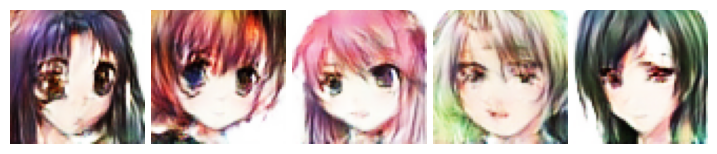

Epoch 16/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.10it/s]

Epoch 16/50 | G Loss: 0.9448 | D Loss: 1.1906


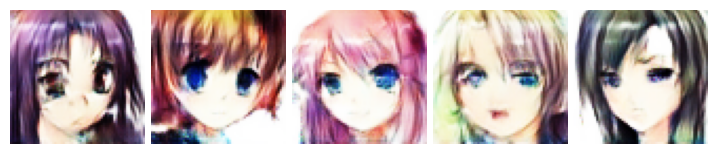

Epoch 17/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.11it/s]


Epoch 17/50 | G Loss: 0.9564 | D Loss: 1.1837


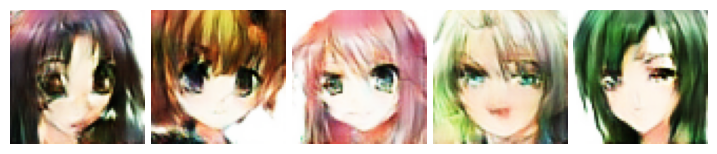

Epoch 18/50 | Batches: 100%|██████████| 979/979 [02:47<00:00,  5.84it/s]

Epoch 18/50 | G Loss: 0.9651 | D Loss: 1.1814


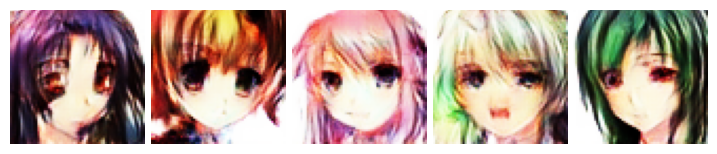

Epoch 19/50 | Batches: 100%|██████████| 979/979 [02:46<00:00,  5.88it/s]

Epoch 19/50 | G Loss: 0.9731 | D Loss: 1.1790


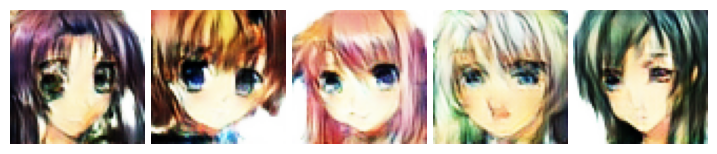

Epoch 20/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.08it/s]

Epoch 20/50 | G Loss: 0.9851 | D Loss: 1.1670


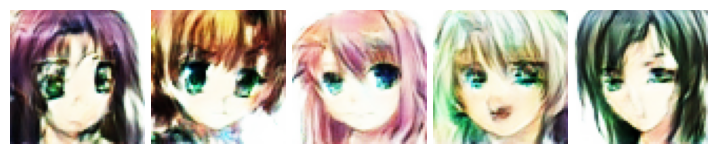

Epoch 21/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.10it/s]


Epoch 21/50 | G Loss: 0.9889 | D Loss: 1.1652


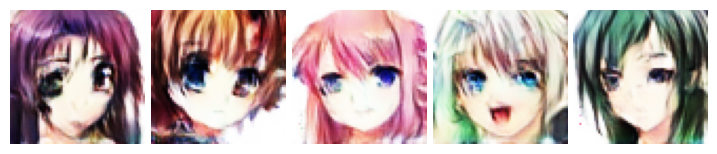

Epoch 22/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.07it/s]

Epoch 22/50 | G Loss: 1.0047 | D Loss: 1.1572


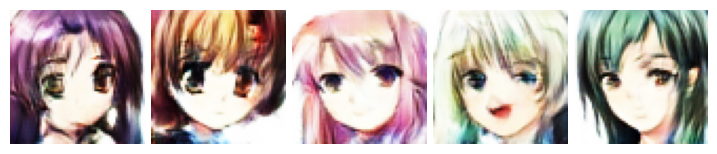

Epoch 23/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.08it/s]


Epoch 23/50 | G Loss: 1.0124 | D Loss: 1.1510


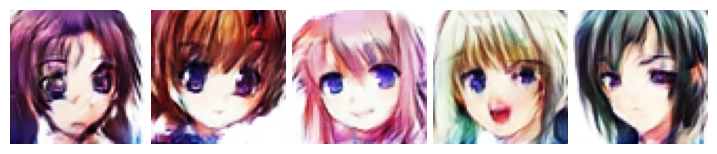

Epoch 24/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.08it/s]

Epoch 24/50 | G Loss: 1.0172 | D Loss: 1.1464


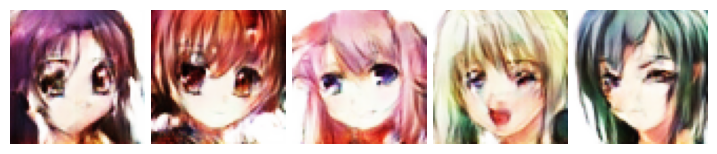

Epoch 25/50 | Batches: 100%|██████████| 979/979 [02:44<00:00,  5.93it/s]

Epoch 25/50 | G Loss: 1.0321 | D Loss: 1.1397


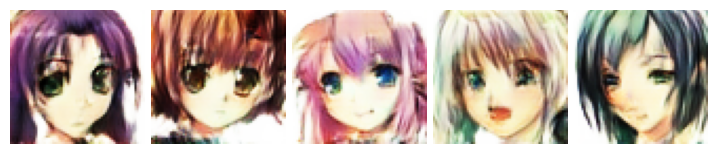

Epoch 26/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.04it/s]

Epoch 26/50 | G Loss: 1.0411 | D Loss: 1.1335


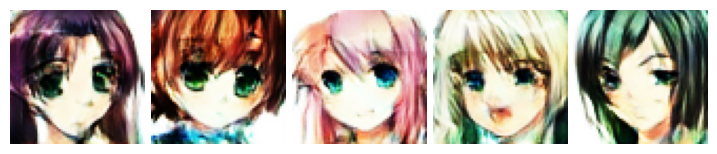

Epoch 27/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.11it/s]


Epoch 27/50 | G Loss: 1.0800 | D Loss: 1.1125


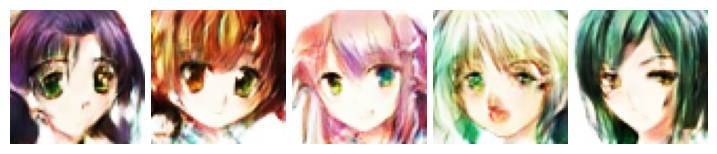

Epoch 28/50 | Batches: 100%|██████████| 979/979 [02:43<00:00,  5.99it/s]

Epoch 28/50 | G Loss: 1.0657 | D Loss: 1.1174


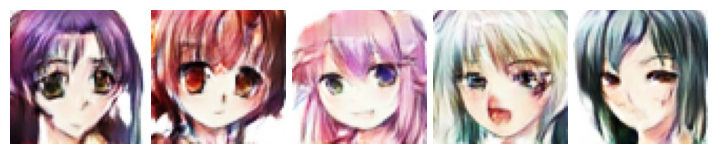

Epoch 29/50 | Batches: 100%|██████████| 979/979 [02:45<00:00,  5.90it/s]

Epoch 29/50 | G Loss: 1.0859 | D Loss: 1.1099


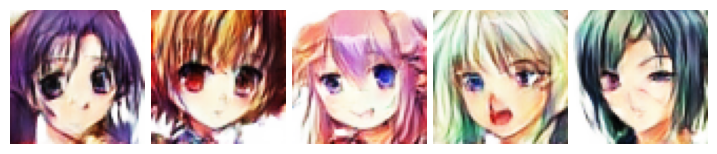

Epoch 30/50 | Batches: 100%|██████████| 979/979 [02:43<00:00,  6.00it/s]

Epoch 30/50 | G Loss: 1.0942 | D Loss: 1.1034


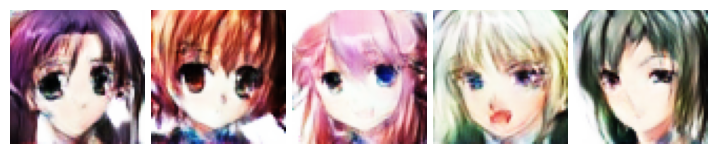

Epoch 31/50 | Batches: 100%|██████████| 979/979 [02:46<00:00,  5.87it/s]


Epoch 31/50 | G Loss: 1.1066 | D Loss: 1.0923


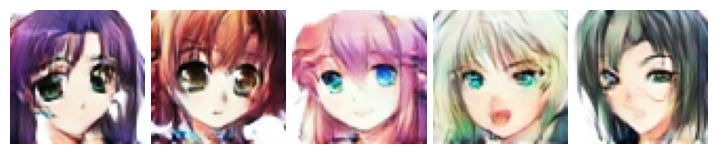

Epoch 32/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.06it/s]


Epoch 32/50 | G Loss: 1.1228 | D Loss: 1.0875


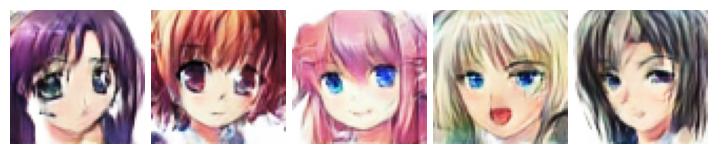

Epoch 33/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.09it/s]

Epoch 33/50 | G Loss: 1.1345 | D Loss: 1.0803


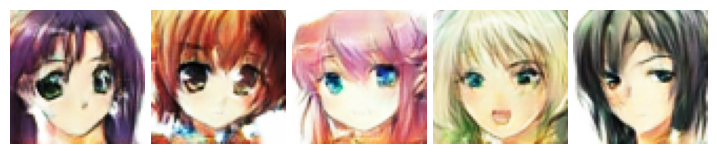

Epoch 34/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.03it/s]

Epoch 34/50 | G Loss: 1.1491 | D Loss: 1.0816


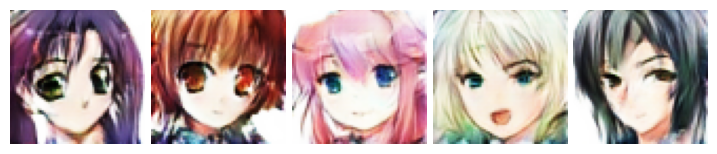

Epoch 35/50 | Batches: 100%|██████████| 979/979 [02:39<00:00,  6.13it/s]

Epoch 35/50 | G Loss: 1.1519 | D Loss: 1.0745


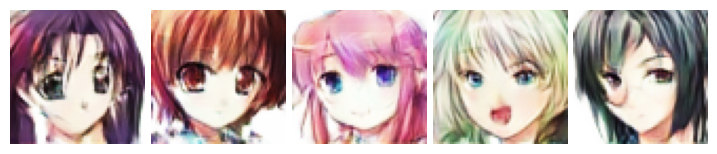

Epoch 36/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.08it/s]

Epoch 36/50 | G Loss: 1.1551 | D Loss: 1.0697


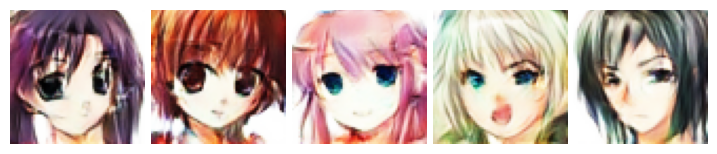

Epoch 37/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.12it/s]

Epoch 37/50 | G Loss: 1.1699 | D Loss: 1.0630


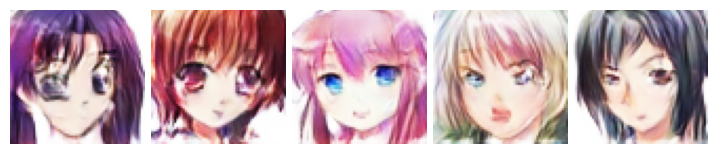

Epoch 38/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.02it/s]

Epoch 38/50 | G Loss: 1.1926 | D Loss: 1.0509


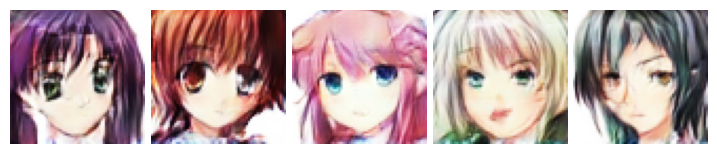

Epoch 39/50 | Batches: 100%|██████████| 979/979 [02:48<00:00,  5.82it/s]


Epoch 39/50 | G Loss: 1.1906 | D Loss: 1.0509


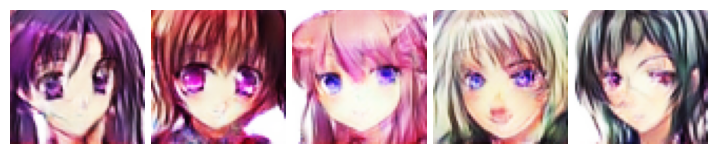

Epoch 40/50 | Batches: 100%|██████████| 979/979 [02:42<00:00,  6.02it/s]

Epoch 40/50 | G Loss: 1.2016 | D Loss: 1.0465


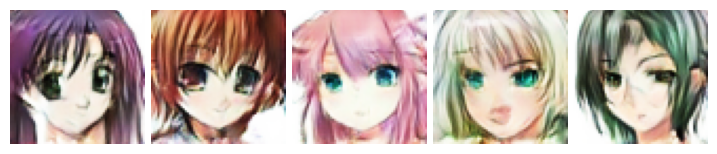

Epoch 41/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.10it/s]

Epoch 41/50 | G Loss: 1.2137 | D Loss: 1.0405


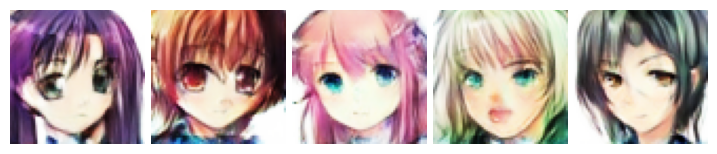

Epoch 42/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.10it/s]

Epoch 42/50 | G Loss: 1.2148 | D Loss: 1.0423


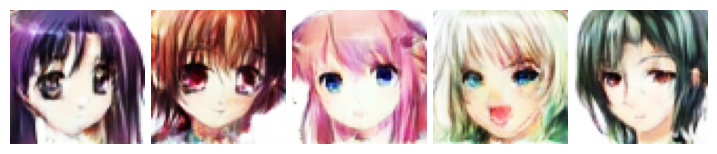

Epoch 43/50 | Batches: 100%|██████████| 979/979 [02:39<00:00,  6.13it/s]

Epoch 43/50 | G Loss: 1.2285 | D Loss: 1.0327


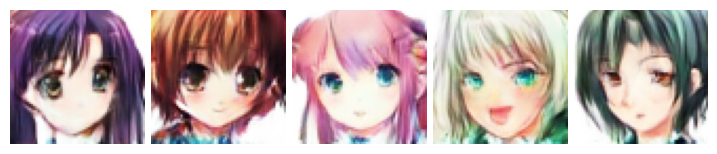

Epoch 44/50 | Batches: 100%|██████████| 979/979 [02:38<00:00,  6.18it/s]

Epoch 44/50 | G Loss: 1.2434 | D Loss: 1.0290


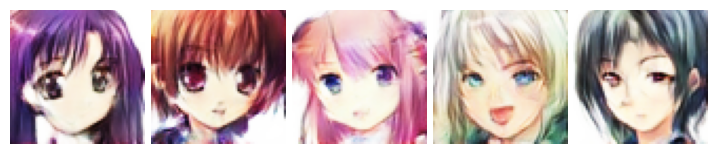

Epoch 45/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.11it/s]


Epoch 45/50 | G Loss: 1.2566 | D Loss: 1.0186


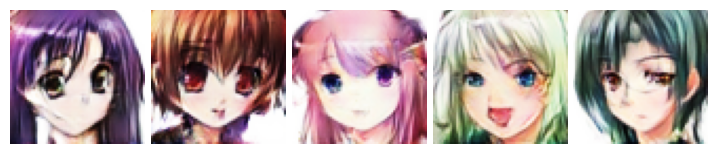

Epoch 46/50 | Batches: 100%|██████████| 979/979 [02:47<00:00,  5.86it/s]

Epoch 46/50 | G Loss: 1.2646 | D Loss: 1.0165


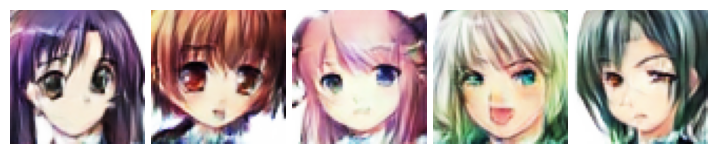

Epoch 47/50 | Batches: 100%|██████████| 979/979 [02:58<00:00,  5.48it/s]

Epoch 47/50 | G Loss: 1.2835 | D Loss: 1.0083


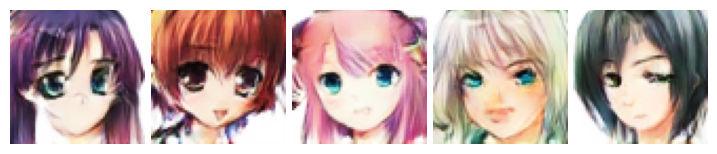

Epoch 48/50 | Batches: 100%|██████████| 979/979 [02:41<00:00,  6.08it/s]

Epoch 48/50 | G Loss: 1.2822 | D Loss: 1.0039


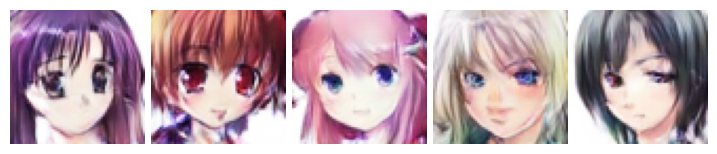

Epoch 49/50 | Batches: 100%|██████████| 979/979 [02:40<00:00,  6.11it/s]

Epoch 49/50 | G Loss: 1.2969 | D Loss: 0.9967


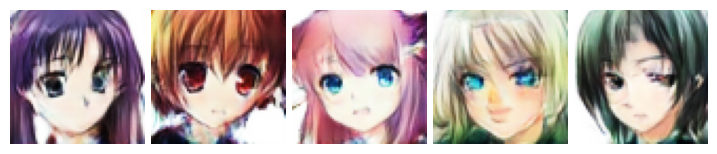

Epoch 50/50 | Batches: 100%|██████████| 979/979 [02:39<00:00,  6.12it/s]


Epoch 50/50 | G Loss: 1.3056 | D Loss: 0.9925


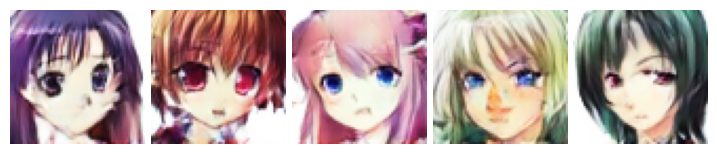

In [25]:
history = train_gan(
    generator_model,
    discriminator_model,
    data_loader,
    epochs = 50,
    loss_function = nn.BCELoss(),
    g_optimizer = g_optimizer,
    d_optimizer = d_optimizer,
    device = default_device
)

## 4-3. Loss Analysis

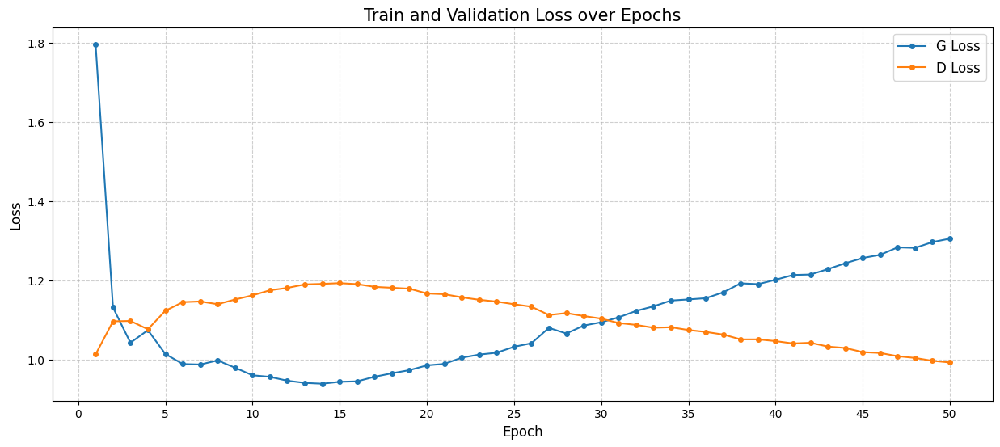

In [26]:
plt.style.use('default')
plt.figure(figsize=(15, 6))
plt.plot(range(1,51), [r['g_loss'] for r in history], label='G Loss', marker='o', markersize=4)
plt.plot(range(1,51), [r['d_loss'] for r in history], label='D Loss', marker='o', markersize=4)
plt.title("Train and Validation Loss over Epochs", fontsize=15)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.xticks(range(0,51,5))
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# 5. Generate Image

In [27]:
noise = torch.randn(5, generator_model.latent_dim).to(default_device)

gen_imgs = generator_model(noise)
gen_imgs = gen_imgs.detach().cpu().numpy()
gen_imgs = ((gen_imgs + 1) * 127.5).astype(np.uint8)
gen_imgs = np.transpose(gen_imgs, (0, 2, 3, 1))

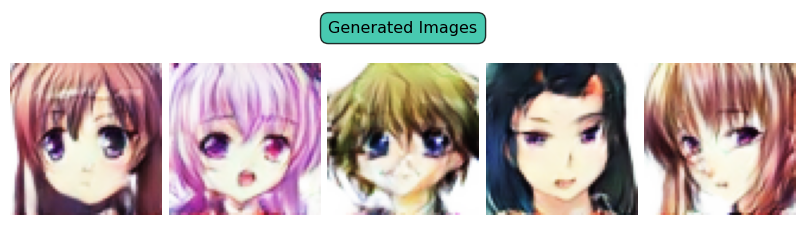

In [28]:
fig = plt.figure(figsize=(8, 2.5))
gs = GridSpec(2, 5, height_ratios=[0.15, 0.85])

title_ax = fig.add_subplot(gs[0, :])
title_ax.text(0.5, 0.5, "Generated Images",
              fontsize=11.5, ha='center', va='center',
              bbox=dict(facecolor='#1ABC9C', edgecolor='black', 
                        boxstyle='round,pad=0.5', alpha=0.8))
title_ax.axis('off')

for i in range(5):
    ax = fig.add_subplot(gs[1, i])
    ax.imshow(gen_imgs[i])
    ax.axis('off')

plt.tight_layout(pad=0.5)
plt.show()